# <font color=006A80>Zero Shot CLIP Eyeglasses Detector</font>
#### <font color=006A80>*By Dr. Lihi Gur Arie*</font>
***

## <font color=2892A8>Installation</font>

<font color=003762>Place this notebook in the desired directory. Install and import required libraries:</font>

In [ ]:
!pip install clip-by-openai
!pip install pandas
!pip install -U scikit-learn
!pip install opendatasets
!pip install ipywidgets
!jupyter nbextension enable --py widgetsnbextension --sys-prefix

In [1]:
import numpy as np
import torch
import os
import clip
from PIL import Image
from tqdm.notebook import tqdm_notebook as tqdm
import pandas as pd
from sklearn.metrics import accuracy_score
import zipfile
import random

## <font color=2892A8>Dataset handling</font>

<font color=003762>Download the glasses dataset from Kaggle, either manually from https://www.kaggle.com/datasets/jeffheaton/glasses-or-no-glasses or by using the 'kaggle datasets download' command with the dataset identifier 'glasses-or-no-glasses.zip' if you have a kaggle.json key file (instructions for obtaining the key file can be found at https://www.geeksforgeeks.org/how-to-download-kaggle-datasets-into-jupyter-notebook/</font>)

In [ ]:
!kaggle datasets download -d jeffheaton/glasses-or-no-glasses
# Extract zip dataset
with zipfile.ZipFile('glasses-or-no-glasses.zip', 'r') as zip_ref:
    zip_ref.extractall()

<font color=003762>Helper Function to display images</font>

In [2]:
def display_random_images(dir_path, num_images, seed, save_path=None):
    random.seed(seed)
    image_paths = []
    for subdir, dirs, files in os.walk(dir_path):
        for file in files:
            file_path = os.path.join(subdir, file)
            if file_path.endswith(".png") or file_path.endswith(".jpg") or file_path.endswith(".jpeg"):
                image_paths.append(file_path)

    random_images = random.sample(image_paths, num_images)

    images = [Image.open(image_path) for image_path in random_images]
    widths, heights = zip(*(i.size for i in images))

    total_width = sum(widths)
    max_height = max(heights)

    new_im = Image.new('RGB', (total_width, max_height))

    x_offset = 0
    for im in images:
        new_im.paste(im, (x_offset,0))
        x_offset += im.size[0]

    if save_path:
        new_im.save(save_path)

    display(new_im)


<font color=003762>Display a random selection of images from the 'glasses' dataset</font>

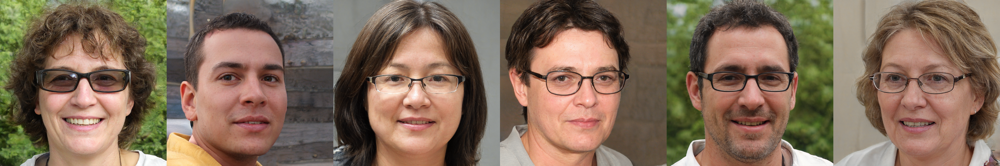

In [3]:
display_random_images(dir_path = 'faces-spring-2020', num_images=6, seed = 12, save_path = 'random_data.jpg')

<font color=003762>Extract image path and label from CSV, using pytorch Dataset class</font>

In [4]:
class CustomDataset(torch.utils.data.Dataset):
    def __init__(self, csv_path, images_folder):
        self.df = pd.read_csv(csv_path)[['id','glasses']]
        self.images_folder = images_folder
        self.class2index = {"no glasses":0, "glasses":1}

    def __len__(self):
        return len(self.df)

    def __getitem__(self, index):
        filename = f'face-{self.df.iloc[index, 0]}.png'
        label = self.df.iloc[index, -1]
        image_path = os.path.join(self.images_folder, filename)
        return image_path, label

path_images = r"faces-spring-2020/faces-spring-2020"
path_csv = r"train.csv"
glasses_dataset = CustomDataset(path_csv, path_images)

## <font color=2892A8>CLIP Custom Classifier</font>

<font color=003762>The 'CustomClassifier' class defines a custom zero-shot image classifier that uses a pre-trained CLIP model. The 'classify' method classifies a single image, while the 'validate' method classifies a directory of images and evaluates performance.</font>

In [5]:
class CustomClassifier:

    def __init__(self, prompts):

        self.class_prompts = prompts
        self.device = "cuda" if torch.cuda.is_available() else "cpu"
        self.model, self.preprocess = clip.load("RN50", device=self.device) # "ViT-B/32"
        self.preprocessed_text = clip.tokenize(self.class_prompts).to(self.device)
        print(f'Classes Prompts: {self.class_prompts}')

    def classify(self, image_path, y_true = None):

        preprocessed_image = self.preprocess(Image.open(image_path)).unsqueeze(0).to(self.device)

        with torch.no_grad():
            image_logits, _ = self.model(preprocessed_image, self.preprocessed_text)
            proba_list = image_logits.softmax(dim=-1).cpu().numpy()[0]

        y_pred = np.argmax(proba_list)
        y_pred_proba = np.max(proba_list)
        y_pred_token = self.class_prompts[y_pred]
        results = pd.DataFrame([{'image': image_path, 'y_true': y_true, 'y_pred': y_pred, 'y_pred_token': y_pred_token, 'proba': y_pred_proba}])
        return results

    def validate (self, dataset, max_images):

        df_results = pd.DataFrame()
        for sample in tqdm(range(max_images)):
            image_path, class_idx = dataset[sample]
            image_results = self.classify(image_path, class_idx)
            df_results = pd.concat([df_results, image_results])

        accuracy = accuracy_score(df_results.y_true, df_results.y_pred)
        print(f'Accuracy - {round(accuracy,2)}')
        return accuracy, df_results

<font color=003762>Prediction of a single image:</font>

In [6]:
image_path = r'faces-spring-2020/faces-spring-2020/face-1.png'
prompts = ['no glasses', 'glasses']
image_results = CustomClassifier(prompts).classify(image_path)

print(f"Prediction - '{image_results.y_pred_token[0]}'")

Classes Prompts: ['no glasses', 'glasses']
Prediction - 'no glasses'


<font color=003762>Classification and evaluation of an entire images folder.</font>

In [7]:
accuracy, df_results = CustomClassifier(prompts).validate(glasses_dataset, max_images =100)
display(df_results)

Classes Prompts: ['no glasses', 'glasses']


  0%|          | 0/100 [00:00<?, ?it/s]

Accuracy - 0.82


,image,y_true,y_pred,y_pred_token,proba
0,faces-spring-2020/faces-spring-2020/face-1.png,0,0,no glasses,0.970872
0,faces-spring-2020/faces-spring-2020/face-2.png,1,1,glasses,0.537830
0,faces-spring-2020/faces-spring-2020/face-3.png,1,1,glasses,0.754946
0,faces-spring-2020/faces-spring-2020/face-4.png,0,0,no glasses,0.771109
0,faces-spring-2020/faces-spring-2020/face-5.png,0,0,no glasses,0.987153
...,...,...,...,...,...
0,faces-spring-2020/faces-spring-2020/face-96.png,1,1,glasses,0.897503
0,faces-spring-2020/faces-spring-2020/face-97.png,1,1,glasses,0.743527
0,faces-spring-2020/faces-spring-2020/face-98.png,1,0,no glasses,0.936901
0,faces-spring-2020/faces-spring-2020/face-99.png,0,0,no glasses,0.786995


<font color=2892A8>Prompt Engineering</font>

In [8]:
prompts = ['face without glasses', 'face with glasses']
accuracy, df_results = CustomClassifier(prompts).validate(glasses_dataset, max_images =100)

Classes Prompts: ['face without glasses', 'face with glasses']


  0%|          | 0/100 [00:00<?, ?it/s]

Accuracy - 0.89


In [9]:
prompts = ['photo of a man with no glasses', 'photo of a man with glasses']
accuracy, df_results = CustomClassifier(prompts).validate(glasses_dataset, max_images =100)

Classes Prompts: ['photo of a man with no glasses', 'photo of a man with glasses']


  0%|          | 0/100 [00:00<?, ?it/s]

Accuracy - 0.94
